# Chapter 4: Quicksort

- You learn about divide-and-conquer. Sometimes you’ll come across a problem that can’t be solved by any algorithm you’ve learned. When a good algorithmist comes across such a problem, they don’t just give up. They have a toolbox full of techniques they use on the problem, trying to come up with a solution. Divide-and-conquer is the first general technique you learn.
- You learn about quicksort, an elegant sortingalgorithm that’s often used in practice. Quicksort uses divide-and-conquer.

## Divide and conquer

Suppose you’re a farmer with a plot of land.

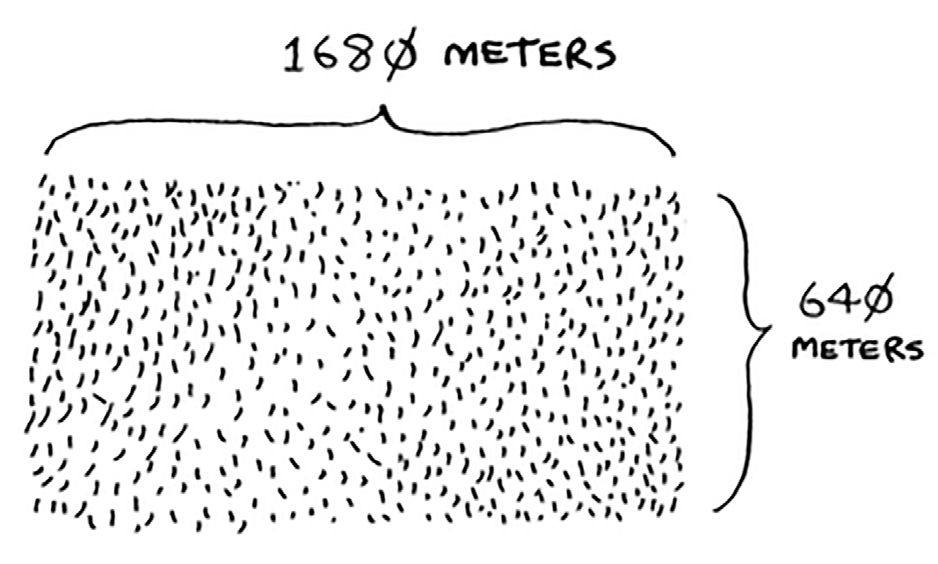

You want to divide this farm evenly into square plots. You want the plots
to be as big as possible. So none of these will work.

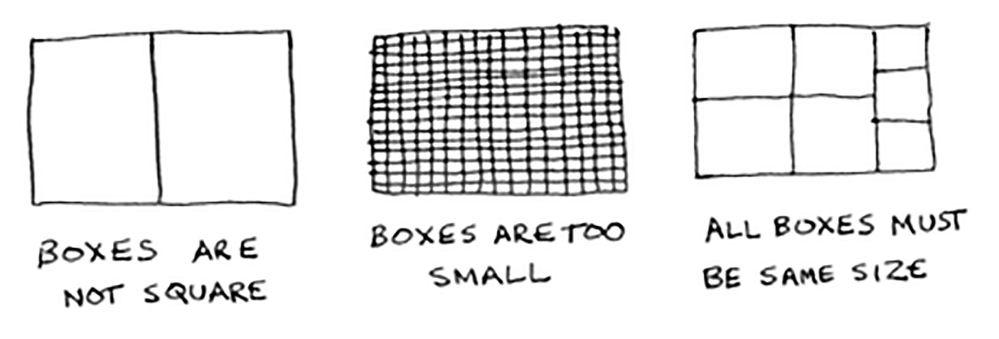

How do you figure out the largest square size you can use for a plot of land? Use the D&C strategy! D&C algorithms are recursive algorithms.
To solve a problem using D&C, there are two steps:
1. Figure out the base case. This should be the simplest possible case.
2. Divide or decrease your problem until it becomes the base case.
Let’s use D&C to find the solution to this problem. What is the largest square size you can use?
First, figure out the base case. The easiest case would be if one side was a multiple of the other side.

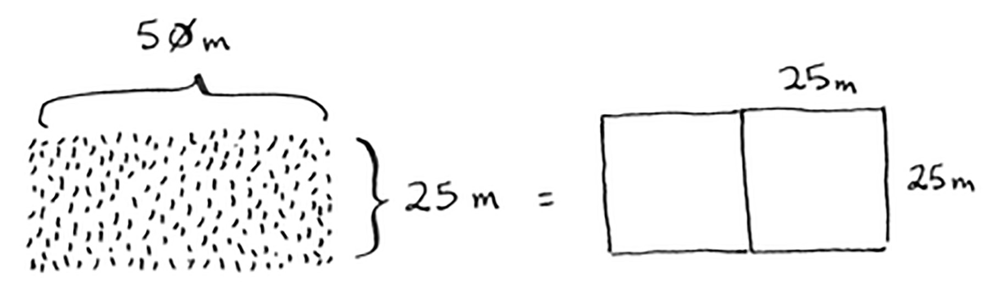

Suppose one side is 25 meters (m) and the other side is 50 m. Then the largest box you can use is 25 m × 25 m. You need two of those boxes to divide up the land.
Now you need to figure out the recursive case. This is where D&C comes in. According to D&C, with every recursive call, you have to reduce your problem. How do you reduce the problem here? Let’s start by marking out the biggest boxes you can use.

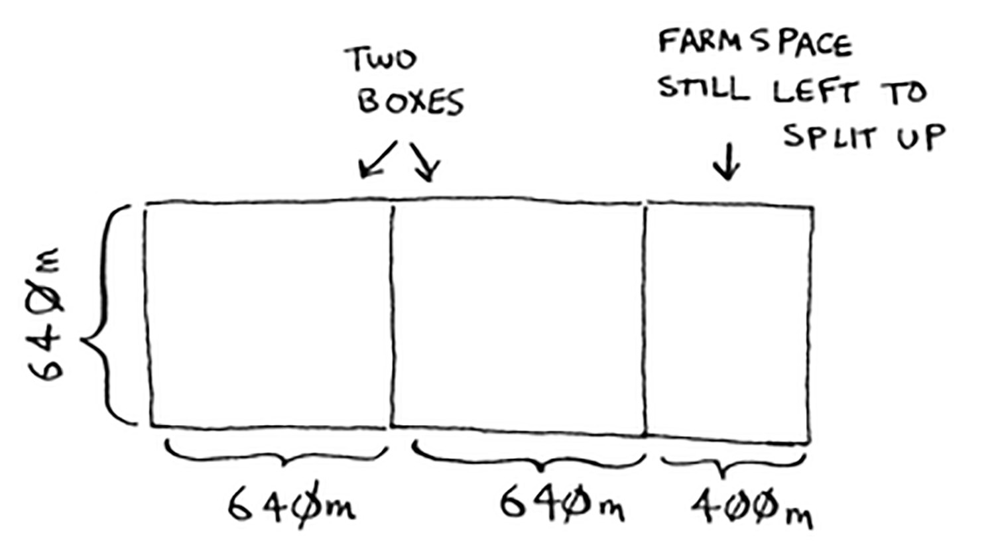

You can fit two 640 × 640 boxes in there, and there’s some land still left to be divided. Now here comes the “Aha!” moment. There’s a farm segment left to divide. Why don’t you apply the same algorithm to this segment?

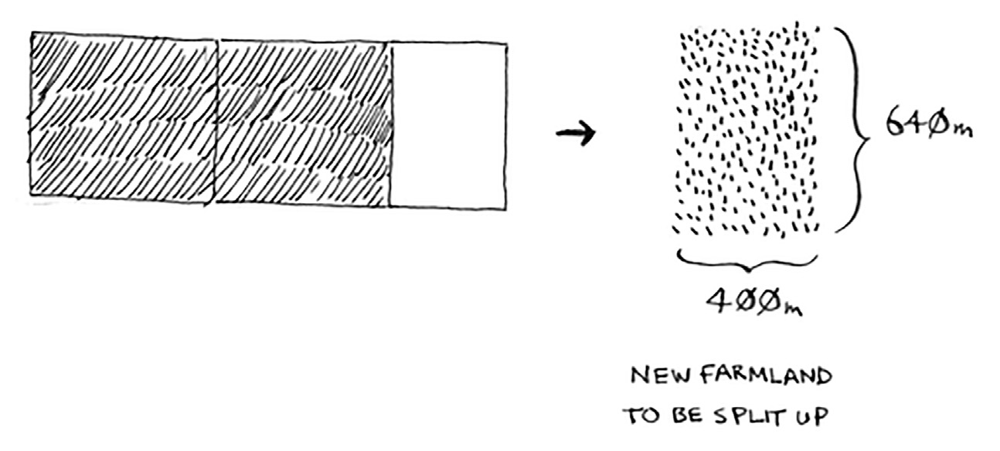

So you started out with a 1680 × 640 farm that needed to be split up. But now you need to split up a smaller segment, 640 × 400. If you find the biggest box that will work for this size, that will be the biggest box that will work for the entire farm. You just reduced the problem from a 1680 × 640 farm to a 640 × 400 farm!

---

**Euclid's algorithm**

“If you find the biggest box that will work for this size, that will be the biggest box that will work for the entire farm.” If it’s not obvious to you why this statement is true, don’t worry. It isn’t obvious. Unfortunately, the proof for why it works is a little too long to include in this book, so you’ll just have to believe me that it works. If you want to understand the proof, look up Euclid’s algorithm. The Khan academy has a good explanation [here](https://www.khanacademy.org/computing/computer-science/cryptography/modarithmetic/a/the-euclidean-algorithm).

---

Let’s apply the same algorithm again. Starting with a 640 × 400m farm, the biggest box you can create is 400 × 400 m.

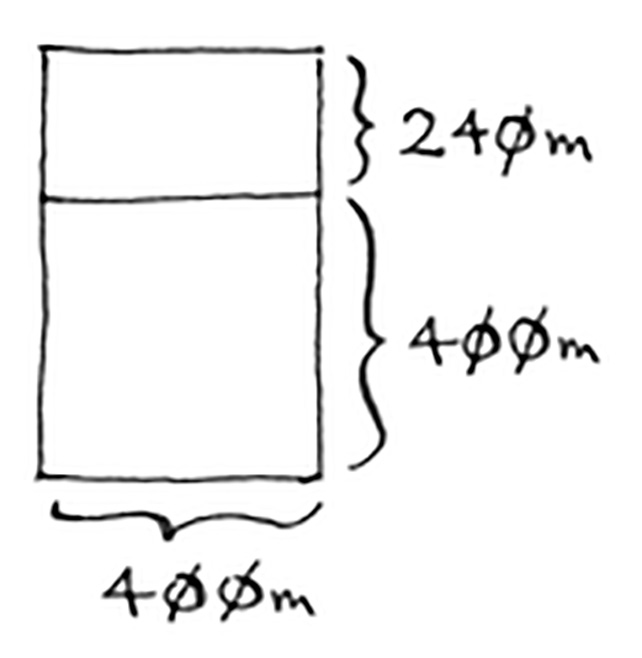

And that leaves you with a smaller segment, 400 × 240 m.

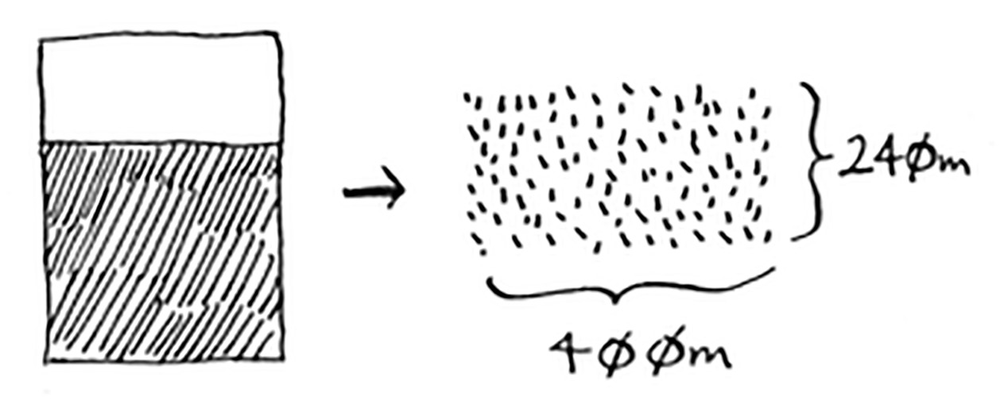

And you can draw a box on that to get an even smaller segment, 240 × 160 m.

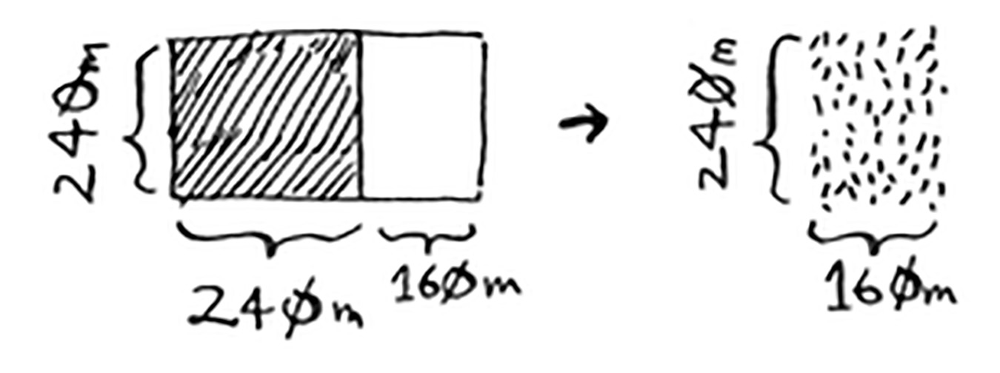

And then you draw a box on that to get an even smaller segment.

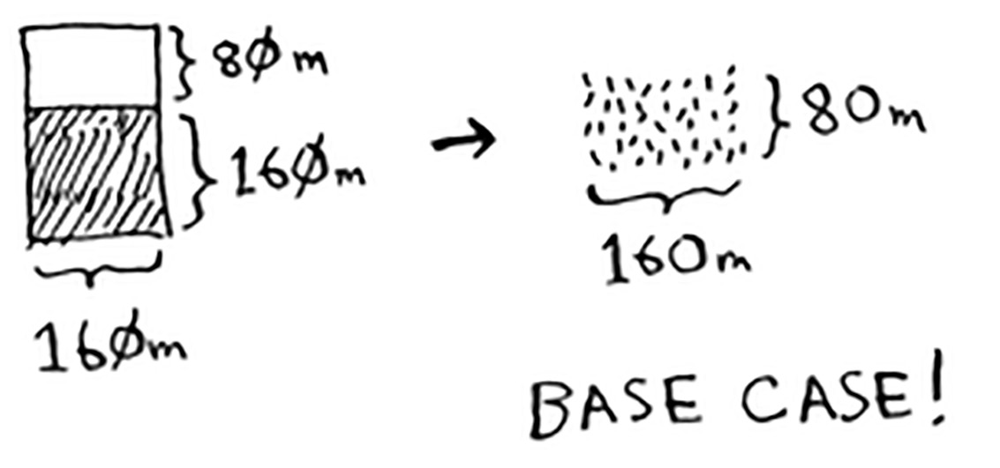

Hey, you’re at the base case: 80 is a factor of 160. If you split up this segment using boxes, you don’t have anything left over!

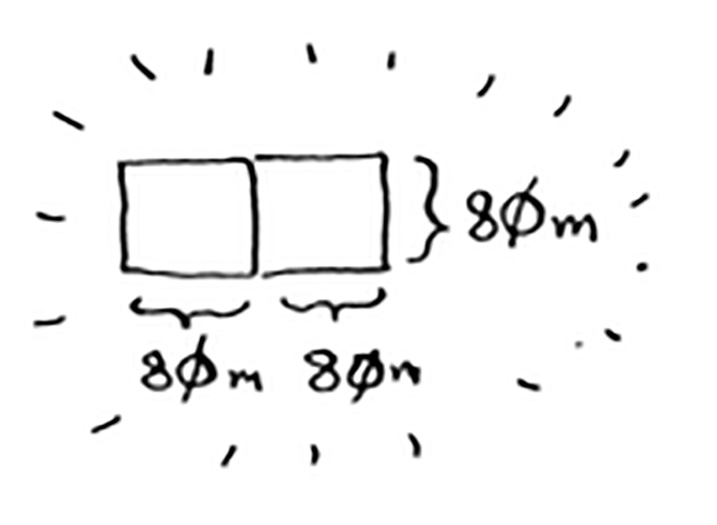

So, for the original farm, the biggest plot size you can use is 80 × 80 m.

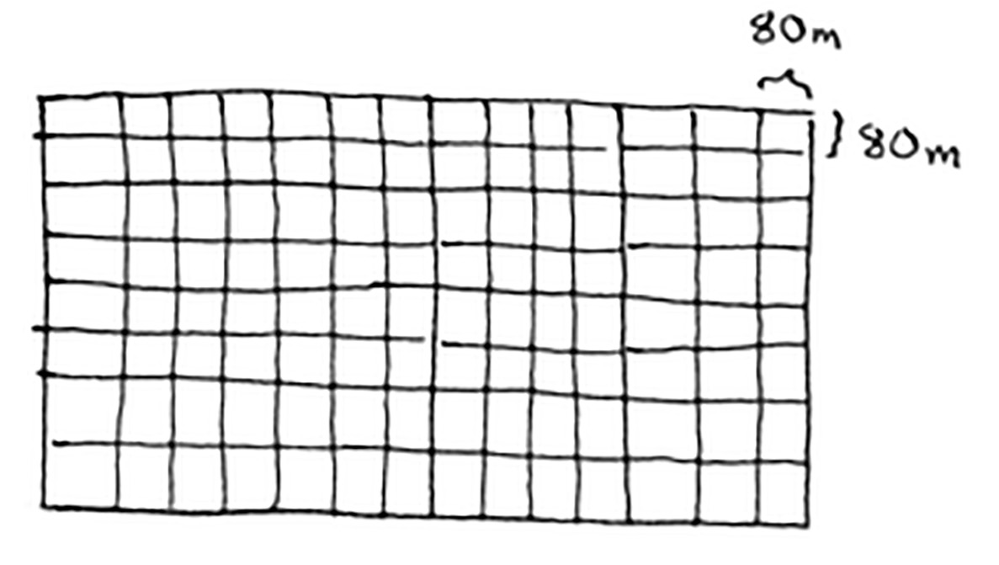

To recap, here’s how D&C works:
1. Figure out a simple case as the base case.
2. Figure out how to reduce your problem and get to the base case.

D&C isn’t a simple algorithm that you can apply to a problem. Instead, it’s a way to think about a problem. Let’s do one more example.
You’re given an array of numbers. 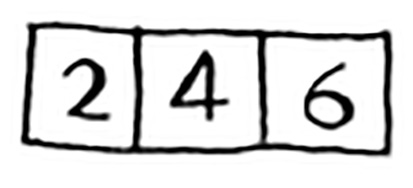
You have to add up all the numbers and return the total. It’s pretty easy to do this with a loop:

In [1]:
def sum(arr):
    total = 0
    for x in arr:
        total += x
    return total

# Test
print(sum([1, 2, 3, 4]))

10


But how would you do this with a recursive function?
**Step 1**: Figure out the base case. What’s the simplest array you could get? Think about the simplest case, and then read on. If you get an array with 0 or 1 element, that’s pretty easy to sum up.

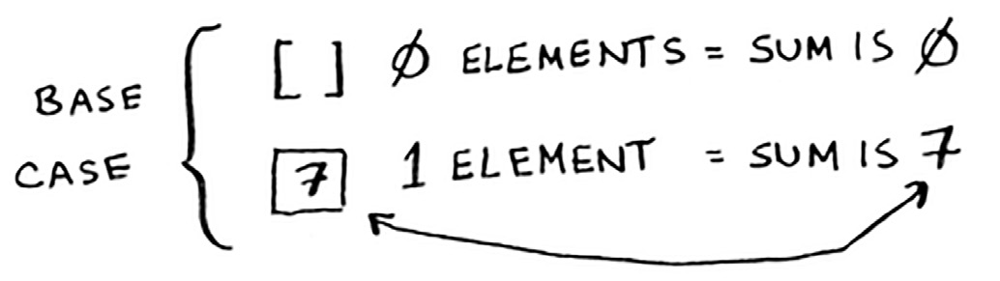

So that will be the base case.

**Step 2:** You need to move closer to an empty array with every recursive call. How do you reduce your problem size? Here’s one way.

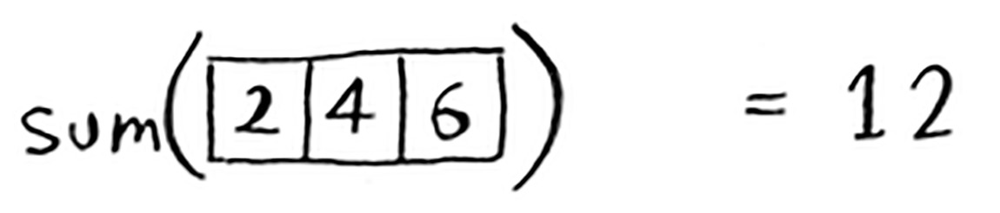

It’s the same as this.

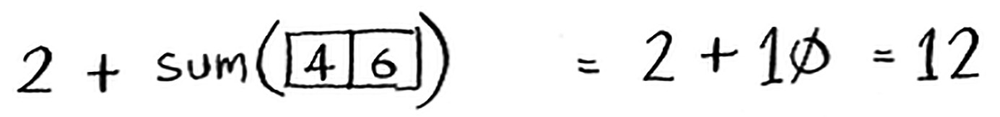


In either case, the result is 12. But in the second version, you’re passing a smaller array into the sum function. That is, you decreased the size of your problem!
Your sum function could work like this.

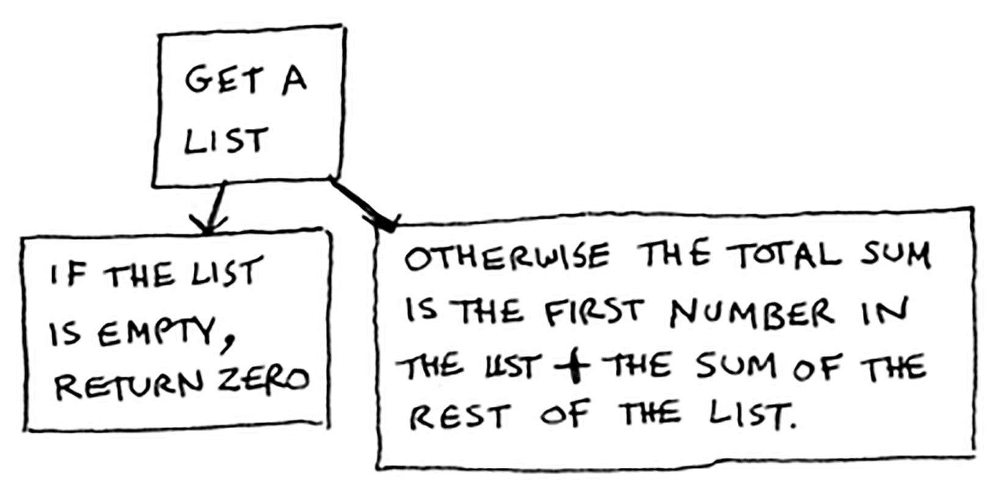

Here it is in action.

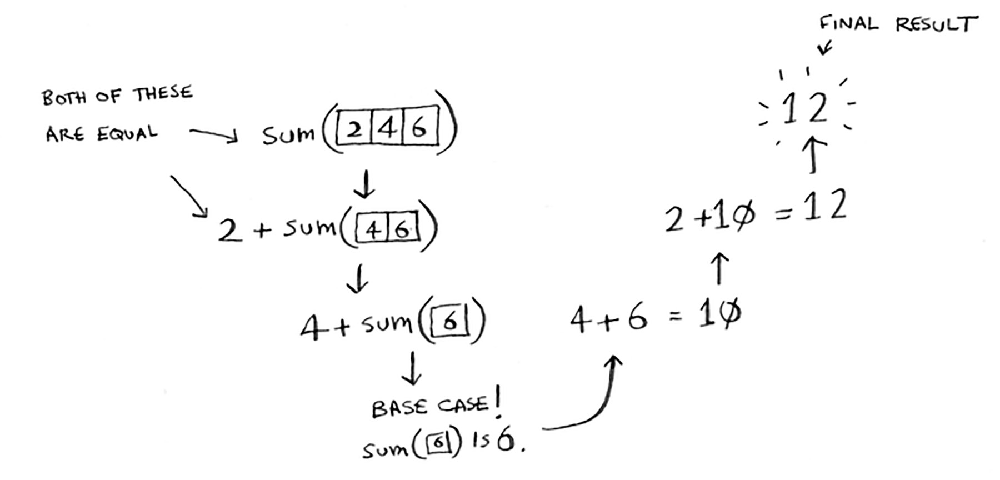

Remember, recursion keeps track of the state.

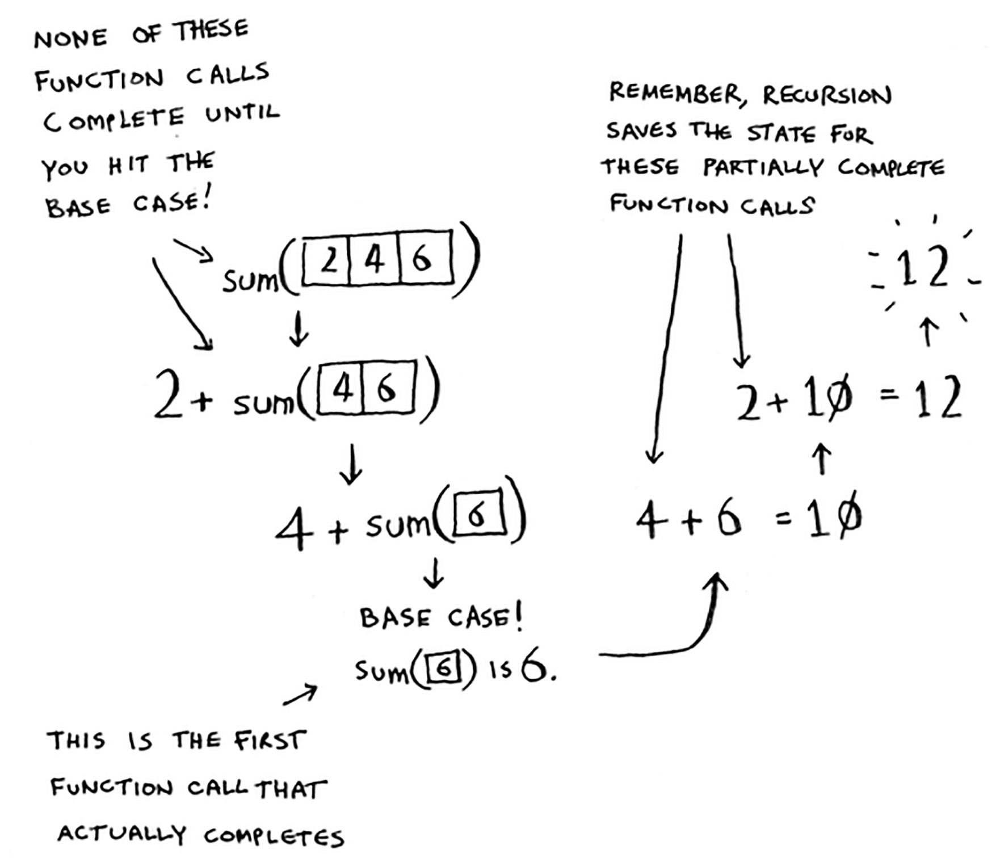

---

**Tip**
When you’re writing a recursive function involving an array, the base case is
often an empty array or an array with one element. If you’re stuck, try that first.

---

#### Sneak peak at functional programming
“Why would I do this recursively if I can do it easily with a loop?” you may be thinking. Well, this is a sneak peek into functional programming! Functional programming languages like Haskell don’t have loops, so you have to use recursion to write functions like this. If you have a good understanding of recursion, functional languages will be easier to learn. For example, here’s how you’d write a sum function in Haskell:

    sum [] = 0                       Base case
    sum (x:xs) = x + (sum xs)        Recursive case

Notice that it looks like you have two definitions for the function. The first definition is run when you hit the base case. The second definition runs at the recursive case. You can also write this function in Haskell using an if statement:

    sum arr = if arr == []
    then 0
    else (head arr) + (sum (tail arr))
    
But the first definition is easier to read. Because Haskell makes heavy use of recursion, it includes all kinds of niceties like this to make recursion easy. If you like recursion, or you’re interested in learning a new language, check out Haskell.

### Exercises

#### 4.1 Write out the code for the earlier *sum* function.

**Answer**

In [8]:
def sum(list):
    if list == []:
        return 0
    return list[0] + sum(list[1:])

# Test
print(sum([1, 2, 3, 4]))

10


#### 4.2 Write recursive function to count the number of items in a list.

**Answer**

In [20]:
def count(list):
    if list == []:
        return 0
    return 1 + count(list[1:])

# Test
print(count([1, 2, 3, 4]))

4


#### 4.3 Find the maximum number in a list.

**Answer**

In [10]:
def max(list):
    if len(list) == 2:
        return list[0] if list[0] > list[1] else list[1]
    sub_max = max(list[1:])
    return list[0] if list[0] > sub_max else sub_max

# Test
print(max([1, 2, 3, 4]))

4


#### 4.4 Remember binary search from chapter 1? It's a divide-and-conquer algorithm, too. Can you come up with the base case and recursive case for binary search?

**Answer**
The base case for binary search is an array with one item. If the item you’re looking for matches the item in the array, you found it! Otherwise, it isn’t in the array.

## Quicksort

Quicksort is a sorting algorithm. It’s much faster than selection sort and is frequently used in real life. For example, the C standard library has a function called qsort, which is its implementation of quicksort. Quicksort also uses D&C.
Let’s use quicksort to sort an array. What’s the simplest array that a sorting algorithm can handle (remember my tip from the previous section)? Well, some arrays don’t need to be sorted at all.

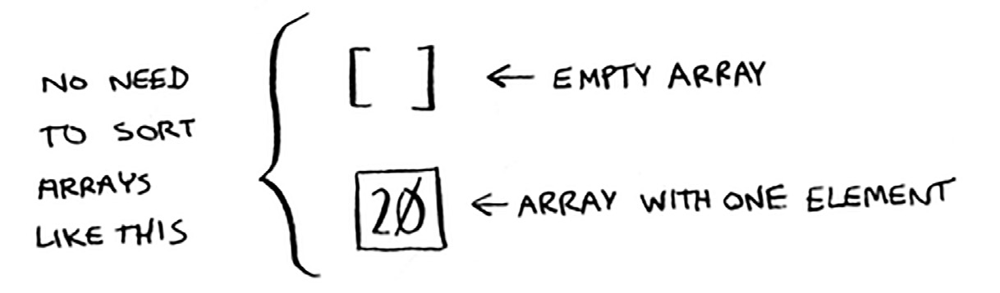

Empty arrays and arrays with just one element will be the base case. You can just return those arrays as is—there’s nothing to sort:

In [11]:
def quicksort(array):
    if len(array) < 2:
        return array

Let’s look at bigger arrays. An array with two elements is pretty easy to sort, too.

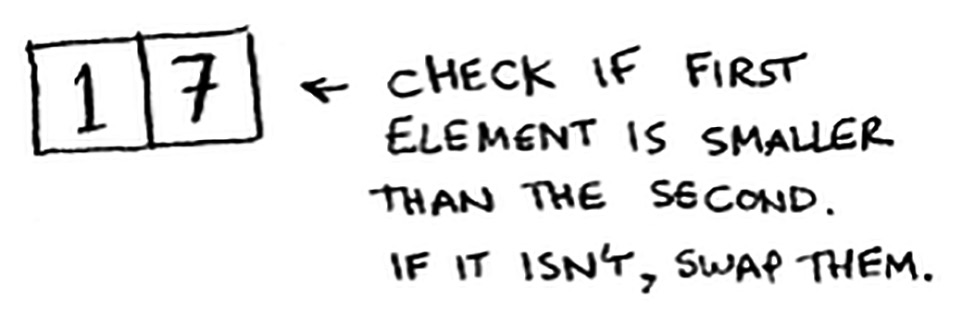

What about an array of three elements? 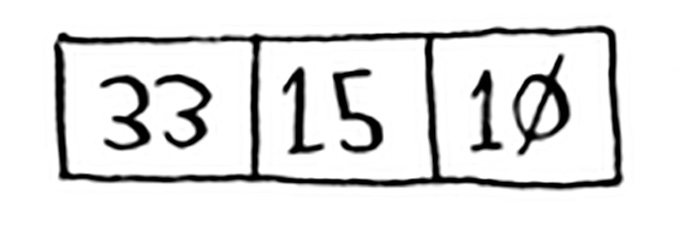

Remember, you’re using D&C. So you want to break down this array until you’re at the base case. Here’s how quicksort works. First, pick an element from the array. This element is called the pivot.

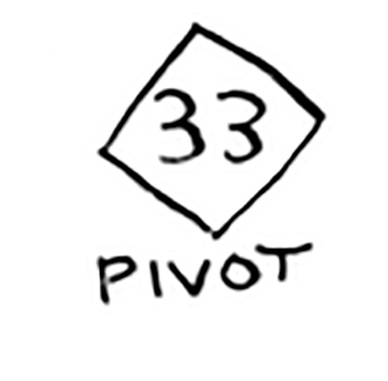

We’ll talk about how to pick a good pivot later. For now,
let’s say the first item in the array is the pivot.

Now find the elements smaller than the pivot and the elements larger than the pivot.

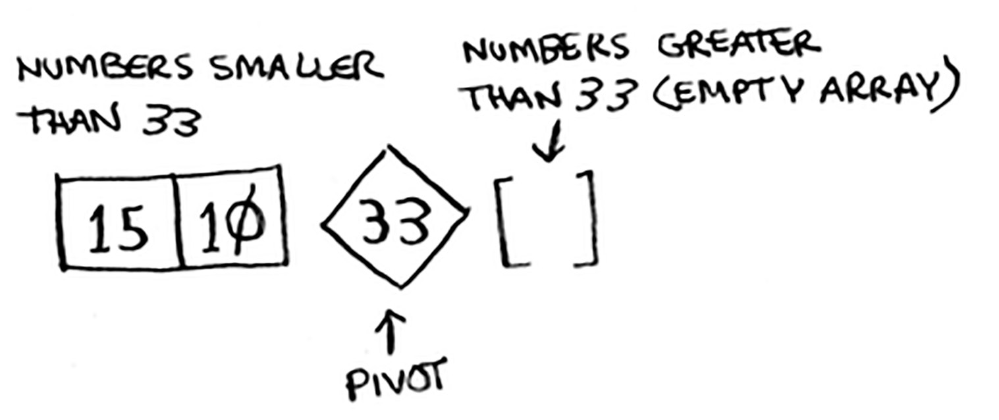

This is called partitioning. Now you have
- A sub-array of all the numbers less than the pivot
- The pivot
- A sub-array of all the numbers greater than the pivot

The two sub-arrays aren’t sorted. They’re just partitioned. But if they were sorted, then sorting the whole array would be pretty easy.

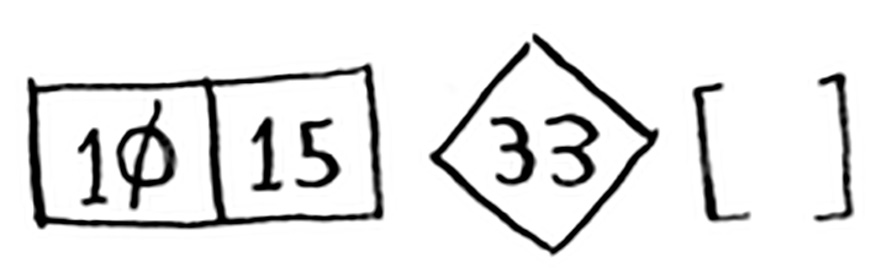

If the sub-arrays are sorted, then you can combine the whole thing like this—left array + pivot + right array—and you get a sorted array. In this case, it’s ``[10, 15] + [33] + [] = [10, 15, 33]``, which is a sorted array.

How do you sort the sub-arrays? Well, the quicksort base case already knows how to sort arrays of two elements (the left sub-array) and empty arrays (the right sub-array). So if you call quicksort on the two sub-arrays and then combine the results, you get a sorted array!

<!-- <div style="background-color:rgba(0, 0, 0, 0.0470588); padding:10px 0;font-family:monospace;">
    This is <font color = "red">pseudocode</font><br>
     &nbsp;&nbsp;&nbsp;&nbsp; More pseudocode <font color = "orange">over</font> there.
</div> -->

```
quicksort([15, 10]) + [33] + quicksort([])
> [10, 15, 33] A sorted array
```

This will work with any pivot. Suppose you choose 15 as the pivot instead.

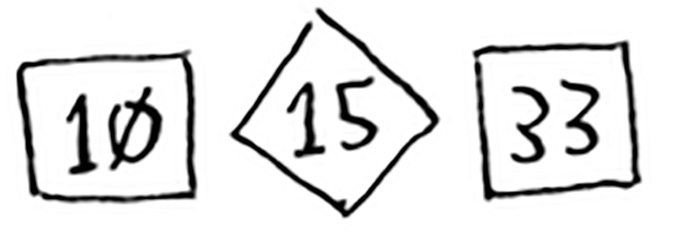

Both sub-arrays have only one element, and you know how to sort those. So now you know how to sort an array of three elements. Here are the steps:
1. Pick a pivot.
2. Partition the array into two sub-arrays: elements less than the pivot and elements greater than the pivot.
3. Call quicksort recursively on the two sub-arrays.

What about an array of four elements?

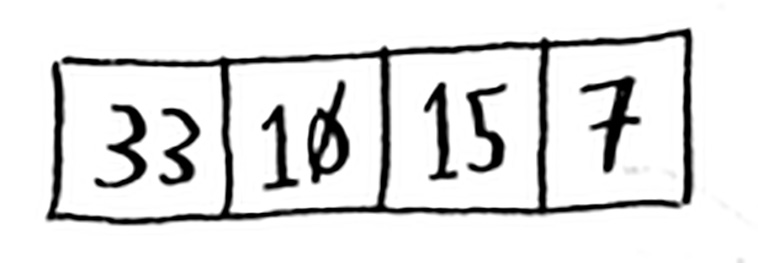

Suppose you choose 33 as the pivot again.

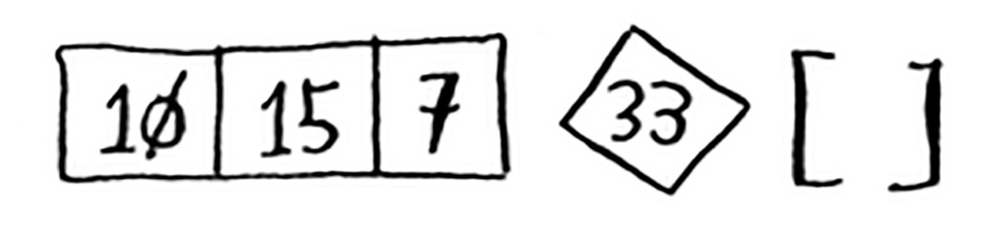

The array on the left has three elements. You already know how to sort an array of three elements: call quicksort on it recursively.

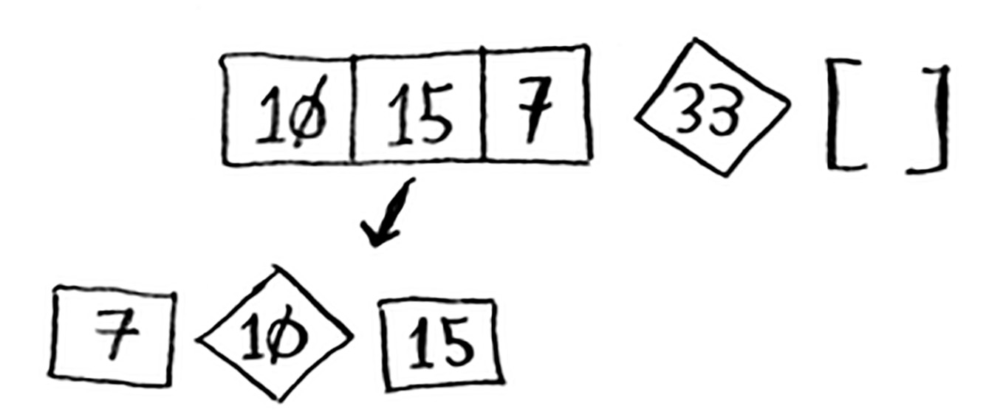

So you can sort an array of four elements. And if you can sort an array of four elements, you can sort an array of five elements. Why is that?
Suppose you have this array of five elements.

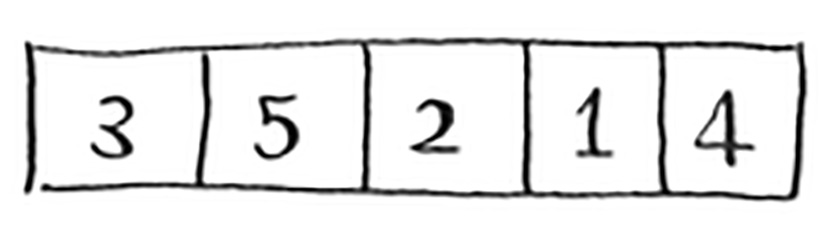

Here are all the ways you can partition this array, depending on what pivot you choose.

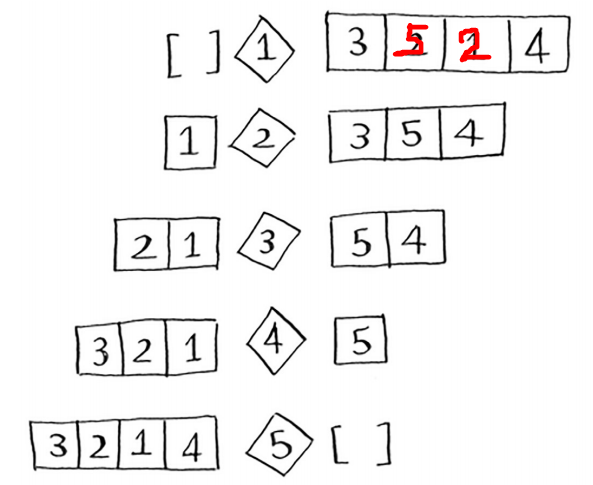

Notice that all of these sub-arrays have somewhere between 0 and 4
elements. And you already know how to sort an array of 0 to 4 elements
using quicksort! So no matter what pivot you pick, you can call
quicksort recursively on the two sub-arrays.

For example, suppose you pick 3 as the pivot. You call quicksort on the sub-arrays.

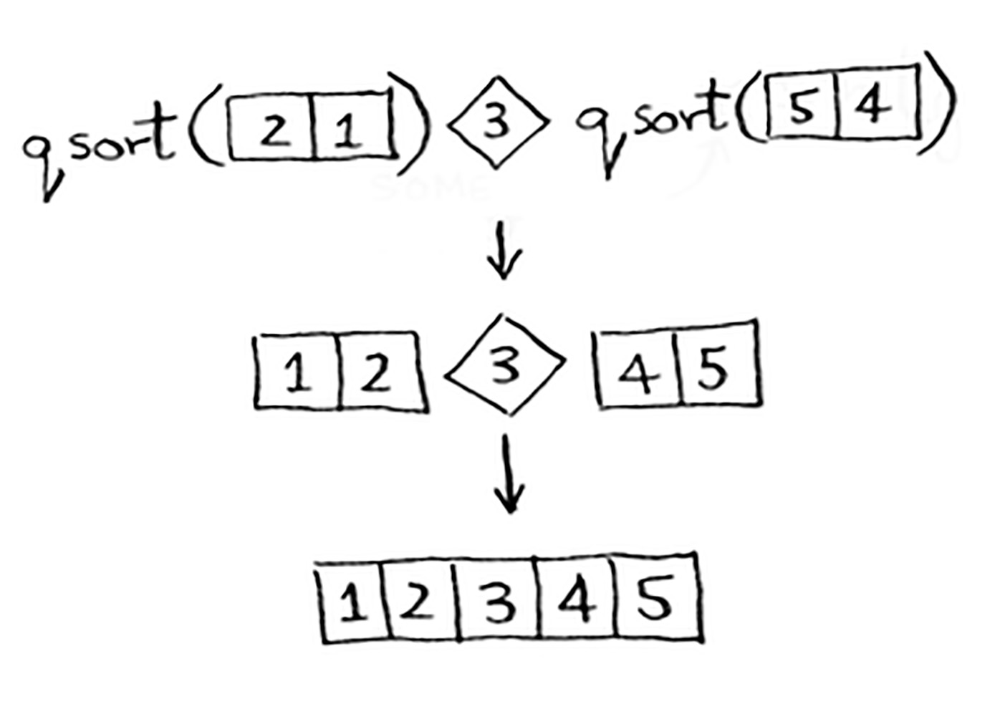

The sub-arrays get sorted, and then you combine the whole thing to get a sorted array. This works even if you choose 5 as the pivot.

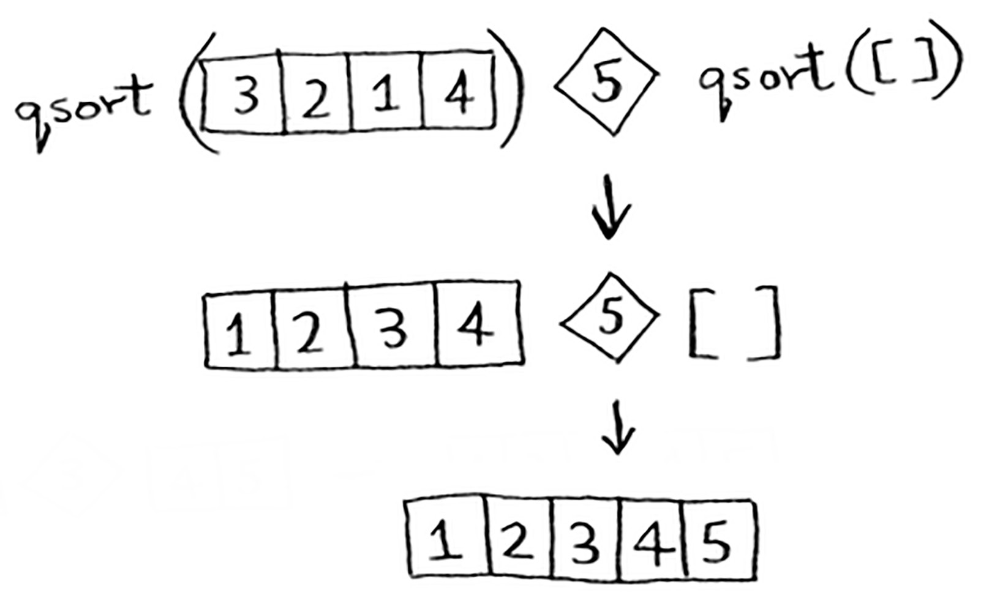

This works with any element as the pivot. So you can sort an array of five elements. Using the same logic, you can sort an array of six elements, and so on.

---


**Inductive proofs**
--

You just got a sneak peak into inductive proofs! Inductive proofs are one
way to prove that your algorithm works. Each inductive proof has two
steps: the base case and the inductive case. Sound familiar? For example,
suppose I want to prove that I can climb to the top of a ladder. In the
inductive case, if my legs are on a rung, I can put my legs on the next rung.
So if I’m on rung 2, I can climb to rung 3. That’s the inductive case. For
the base case, I’ll say that my legs are on rung 1. Therefore, I can climb the
entire ladder, going up one rung at a time.
You use similar reasoning for quicksort. In the base case, I showed that the
algorithm works for the base case: arrays of size 0 and 1. In the inductive
case, I showed that if quicksort works for an array of size 1, it will work
for an array of size 2. And if it works for arrays of size 2, it will work for
arrays of size 3, and so on. Then I can say that quicksort will work for all
arrays of any size. I won’t go deeper into inductive proofs here, but they’re
fun and go hand-in-hand with D&C.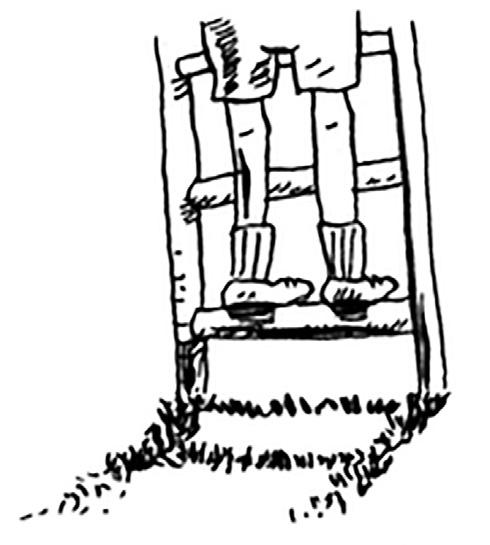

---

Here's the code for quicksort:

In [18]:
def quicksort(array):
    if len(array) < 2:
        return array  # Base case: arrays with 0 or 1 element are already “sorted.”
    else:
        pivot = array[0]   # Recursive case
        less = [i for i in array[1:] if i <= pivot] # Sub-array of all the elements
                                                    # less than the pivot 
        greater = [i for i in array if i > pivot]   #Sub-array of all the elements
                                                    # greater than the pivot
        return quicksort(less) + [pivot] + quicksort(greater)

In [19]:
print(quicksort([4, 1, 7, 15, 2]))

[1, 2, 4, 7, 15]


## Big O notation revisited

Quicksort is unique because its speed depends on the pivot you choose. Before I talk about quicksort, let’s look at the most common Big O run times again.

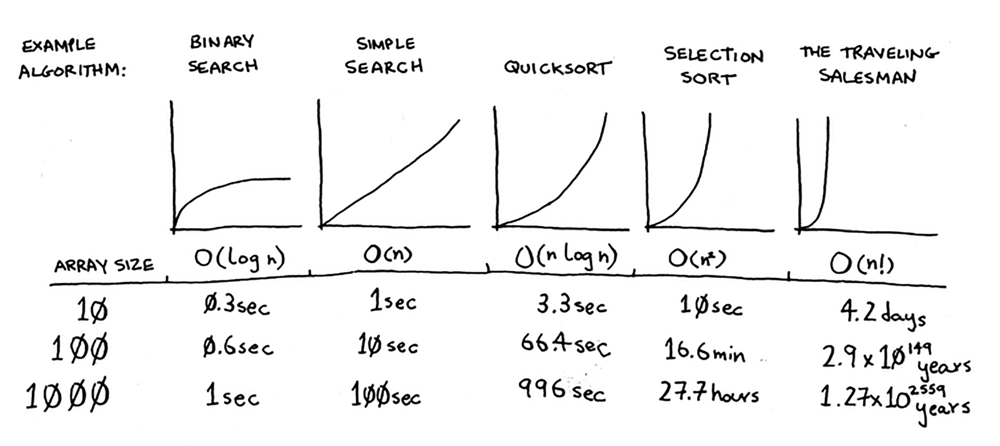
> Estimates based on a slow computer that performs 10 operations per second

The example times in this chart are estimates if you perform 10 operations per second. These graphs aren’t precise—they’re just there to give you a sense of how different these run times are. In reality, your computer can do way more than 10 operations per second.

Each run time also has an example algorithm attached. Check out selection sort, which you learned in chapter 2. It’s O(n2). That’s a pretty slow algorithm.

There’s another sorting algorithm called merge sort, which is O(n log n). Much faster! Quicksort is a tricky case. In the worst case, quicksort takes O(n2) time.

It’s as slow as selection sort! But that’s the worst case. In the average case, quicksort takes O(n log n) time. So you might be wondering:
- What do worst case and average case mean here?
- If quicksort is O(n log n) on average, but merge sort is O(n log n) always, why not use merge sort? Isn’t it faster?

### Merge sort vs. quicksort

Suppose you have this simple function to print every item in a list: 

```python
def print_items(list):
    for item in list:
        print item
```

This function goes through every item in the list and prints it out. Because it loops over the whole list once, this function runs in O(n) time. Now, suppose you change this function so it sleeps for 1 second before it prints out an item:

```python
from time import sleep
def print_items2(list):
    for item in list:
        sleep(1)
        print item
```

Before it prints out an item, it will pause for 1 second. Suppose you print a list of five items using both functions.

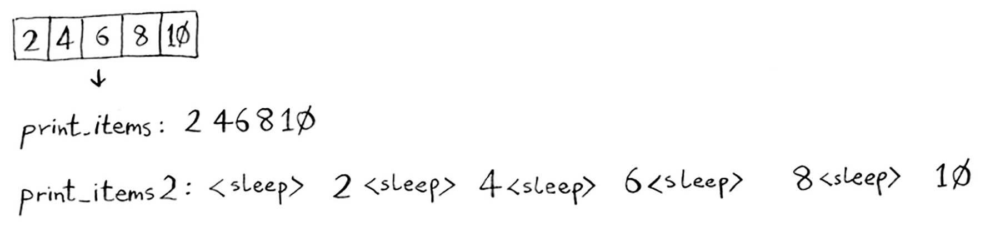

Both functions loop through the list once, so they’re both O(n) time. Which one do you think will be faster in practice? I think print_items will be much faster because it doesn’t pause for 1 second before printing an item. So even though both functions are the same speed in Big O notation, print_items is faster in practice. When you write Big O notation like O(n), it really means this.

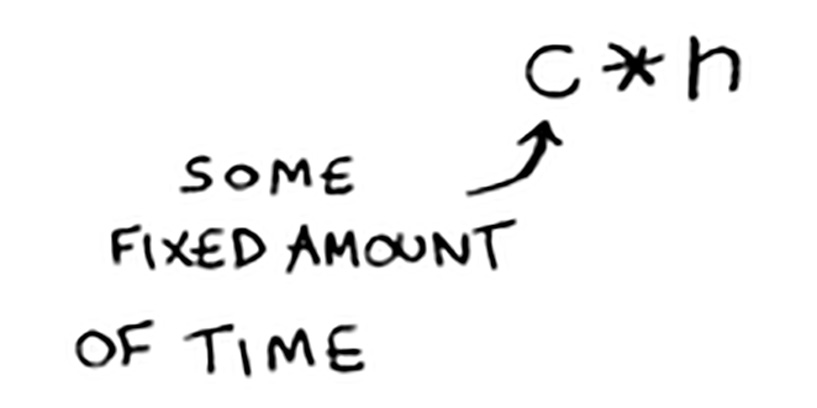

c is some fixed amount of time that your algorithm takes. It’s called the constant. For example, it might be 10 milliseconds * n for print_items versus 1 second * n for print_items2.

You usually ignore that constant, because if two algorithms have different Big O times, the constant doesn’t matter. Take binary search and simple search, for example. Suppose both algorithms had these
constants.

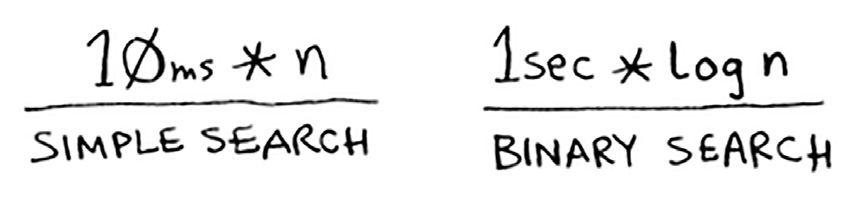

You might say, “Wow! Simple search has a constant of 10 milliseconds, but binary search has a constant of 1 second. Simple search is way faster!” Now suppose you’re searching a list of 4 billion elements. Here are the times.

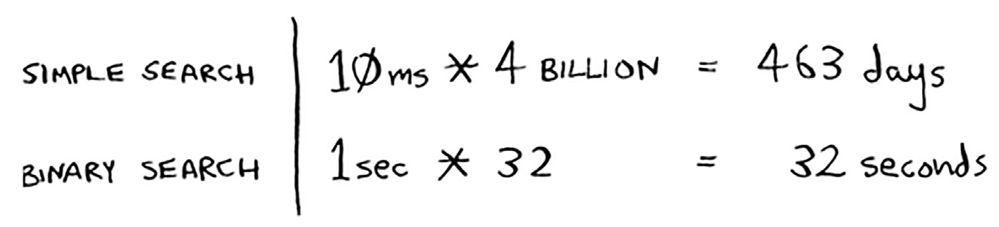

As you can see, binary search is still way faster. That constant didn’t make a difference at all.

But sometimes the constant can make a difference. Quicksort versus merge sort is one example. Quicksort has a smaller constant than merge sort. So if they’re both O(n log n) time, quicksort is faster. And quicksort is faster in practice because it hits the average case way more often than the worst case.

So now you’re wondering: what’s the average case versus the worst case?

### Average case vs. worst case

The performance of quicksort heavily depends on the pivot you choose. Suppose you always choose the first element as the pivot. And you call quicksort with an array that is already sorted. Quicksort doesn’t check to see whether the input array is already sorted. So it will still try to sort it.

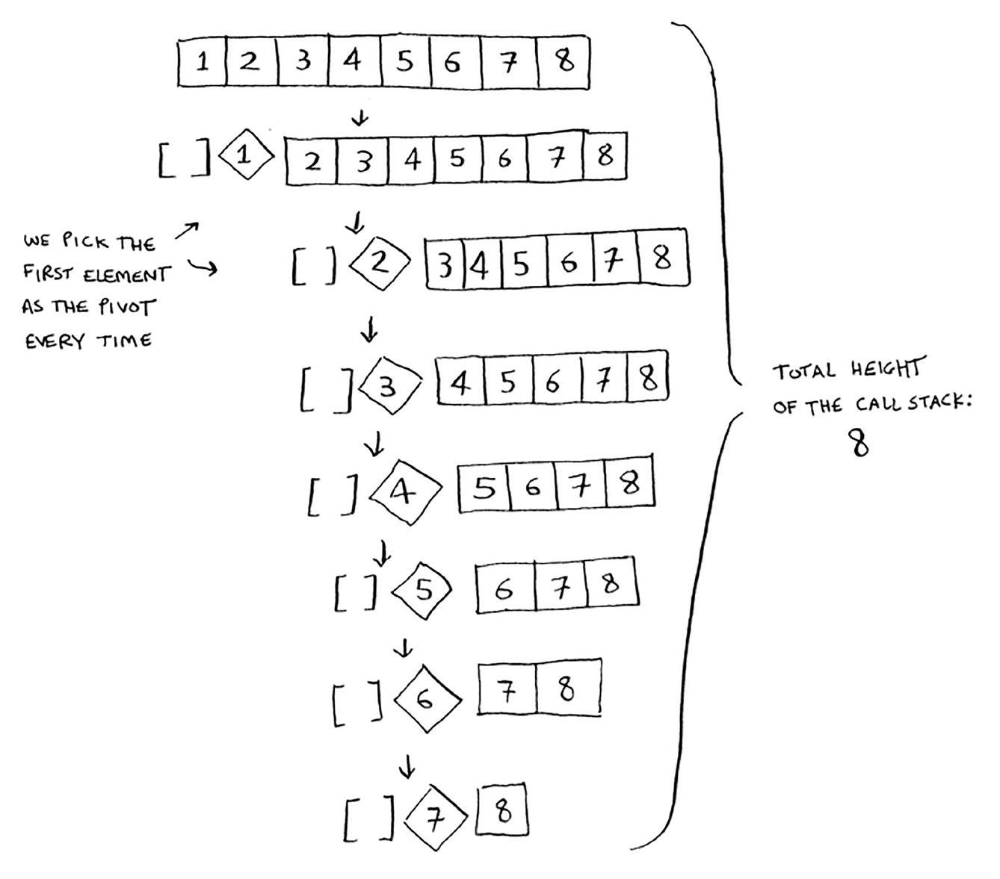

Notice how you’re not splitting the array into two halves. Instead, one of the sub-arrays is always empty. So the call stack is really long. Now instead, suppose you always picked the middle element as the pivot. Look at the call stack now.

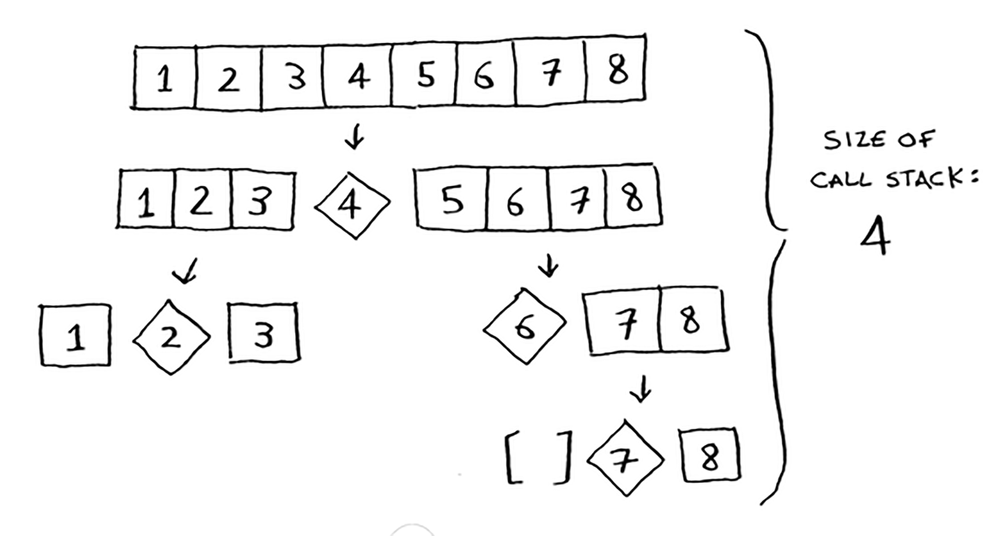

It’s so short! Because you divide the array in half every time, you don’t need to make as many recursive calls. You hit the base case sooner, and the call stack is much shorter.

The first example you saw is the worst-case scenario, and the second example is the best-case scenario. In the worst case, the stack size is O(n). In the best case, the stack size is O(log n).

Now look at the first level in the stack. You pick one element as the pivot, and the rest of the elements are divided into sub-arrays. You touch all eight elements in the array. So this first operation takes O(n) time. You touched all eight elements on this level of the call stack. But actually, you touch O(n) elements on every level of the call stack.

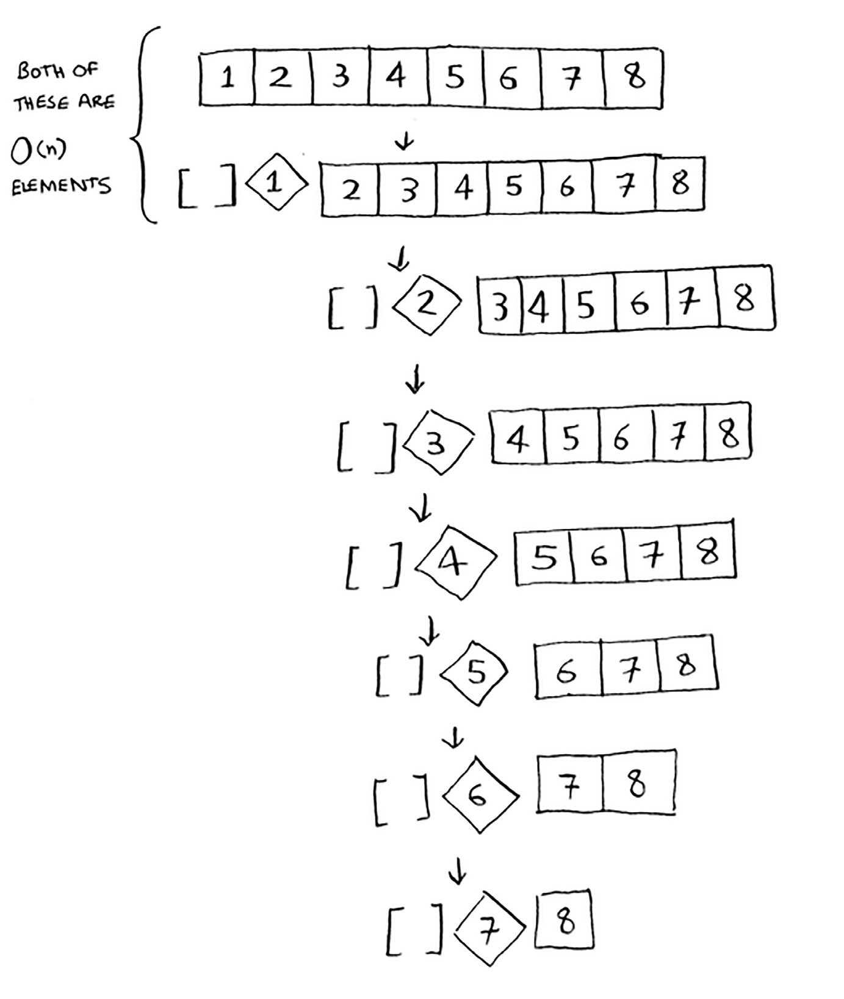

Even if you partition the array differently, you’re still touching O(n) elements every time.

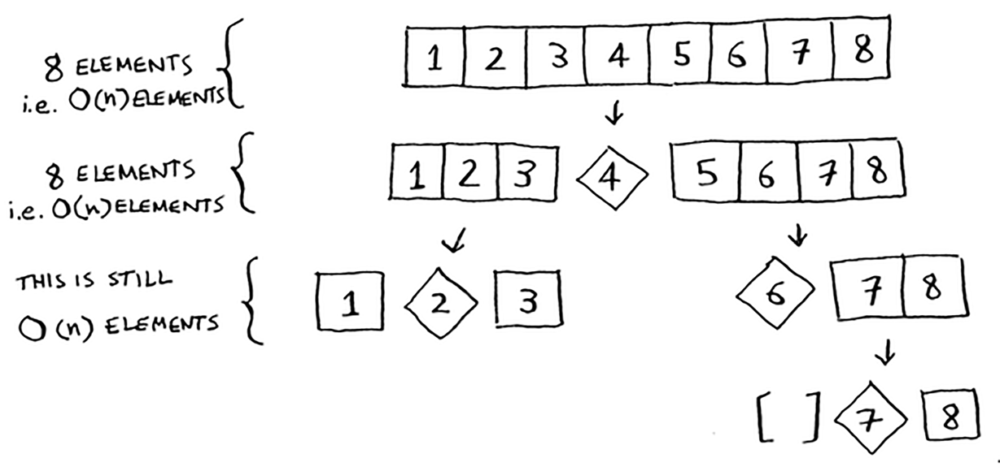

So each level takes O(n) time to complete.

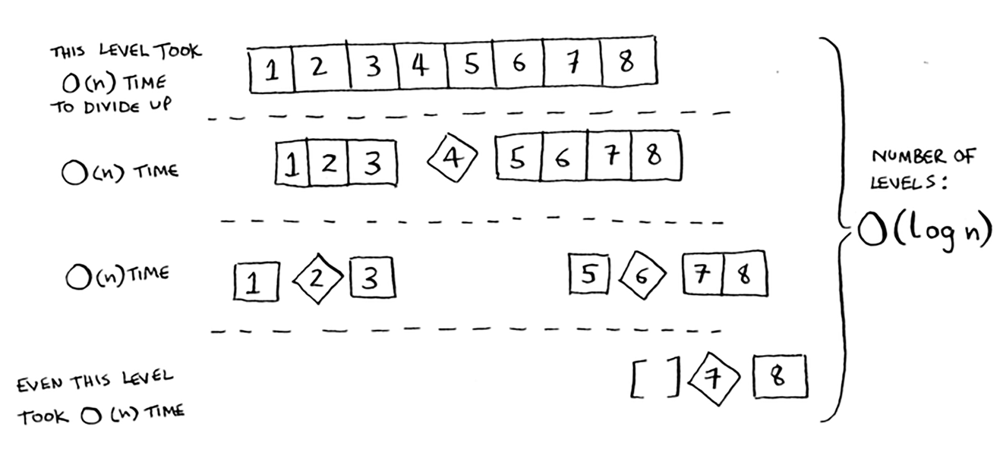

In this example, there are O(log n) levels (the technical way to say that is, “The height of the call stack is O(log n)”). And each level takes O(n) time. The entire algorithm will take O(n) * O(log n) = O(n log n) time. This is the best-case scenario.

In the worst case, there are O(n) levels, so the algorithm will take O(n) * O(n) = O(n<sup>2</sup>) time.

Well, guess what? I’m here to tell you that the best case is also the average case. If you always choose a random element in the array as the pivot, quicksort will complete in O(n log n) time on average. Quicksort is one of the fastest sorting algorithms out there, and it’s a very good example of D&C.

### Exercises: How long would each of these operations take in Big O notation

#### 4.5 Printing the value of each element in an array.

**Answer**
O(n)

#### 4.6 Doubling the value of each element in an array.

**Answer**
O(n)

#### 4.7 Doubling the value of just the first element in an array.

**Answer**
O(1)

#### 4.8 Creating a multiplication table with all the elements in the array. So if your array is [2, 3, 7, 8, 10], you first multiply every element by 2, then multiply every element by 3, then by 7, and so on.

**Answer**
O(n<sup>2</sup>)

### Recap

- D&C works by breaking a problem down into smaller and smaller pieces. If you’re using D&C on a list, the base case is probably an empty array or an array with one element.
- If you’re implementing quicksort, choose a random element as the pivot. The average runtime of quicksort is O(n log n)!
- The constant in Big O notation can matter sometimes. That’s why quicksort is faster than merge sort.
- The constant almost never matters for simple search versus binary search, because O(log n) is so much faster than O(n) when your list gets big.